In [1]:
import cv2
import torch
import torchvision
from torchvision import transforms, ops

import numpy as np
import matplotlib.pyplot as plt

import tqdm
import os

In [2]:
def get_computing_device():
    if torch.cuda.is_available():
        device = torch.device('cuda:0')
    else:
        device = torch.device('cpu')
    return device

DEVICE = get_computing_device()
print(f"Computing device is '{DEVICE}'")

Computing device is 'cpu'


In [3]:
#list of class names for COCO dataset
with open ('coco_class_names.txt','r') as f:
    COCO_CLASS_NAMES = [line.strip() for line in f.readlines()]
COLORS = np.random.uniform(0, 255, size=(len(COCO_CLASS_NAMES), 3))
DATA_FOLDER =  './images'
RESULT_FOLDER = './detected_images'
CONF_THRESH = 0.5

In [4]:
#create a folder where detection results will be saved
os.makedirs(RESULT_FOLDER, exist_ok=True)

In [5]:
def display_image(image, cmap='viridis'):
    plt.rcParams["figure.figsize"] = (20,20)
    plt.imshow(image, cmap=cmap)
    plt.show()

In [6]:
from torchvision.models.detection.retinanet import retinanet_resnet50_fpn

#load pre-traind RetinaNet model 
detection_model = retinanet_resnet50_fpn(pretrained=True).to(DEVICE)
detection_model.eval()

RetinaNet(
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d(256, eps=0.0)


[DETECTION] person : 90.39%
[DETECTION] person : 88.55%
[DETECTION] laptop : 85.96%
[DETECTION] person : 83.98%
[DETECTION] person : 78.53%
[DETECTION] person : 73.52%
[DETECTION] person : 70.73%
[DETECTION] remote : 67.06%
[DETECTION] potted plant : 63.87%
[DETECTION] laptop : 51.85%


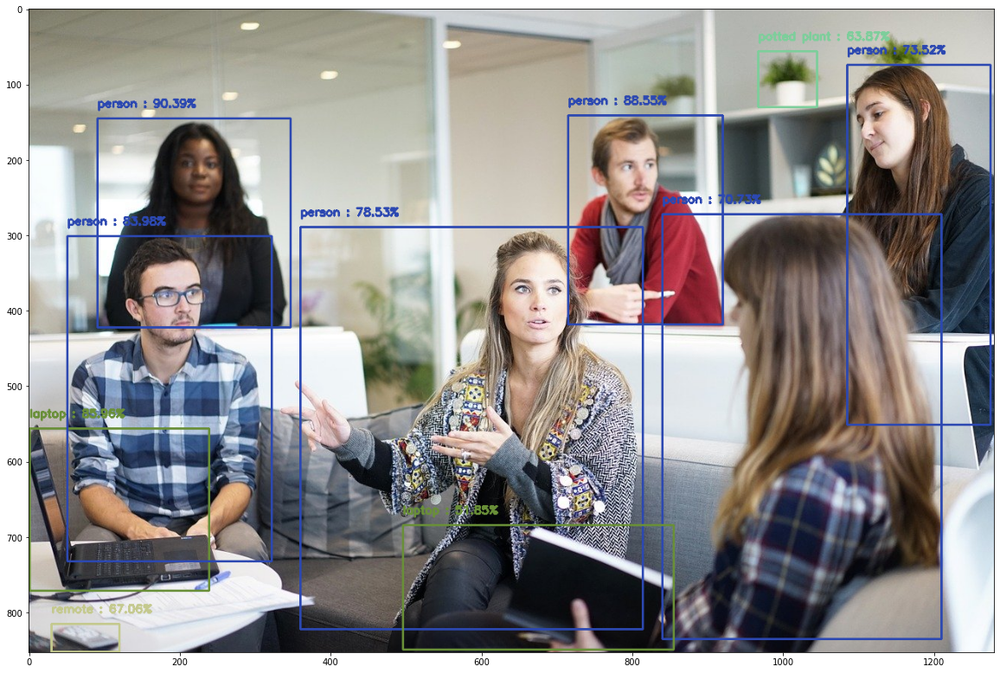

[DETECTION] horse : 94.38%
[DETECTION] horse : 90.17%
[DETECTION] horse : 89.75%


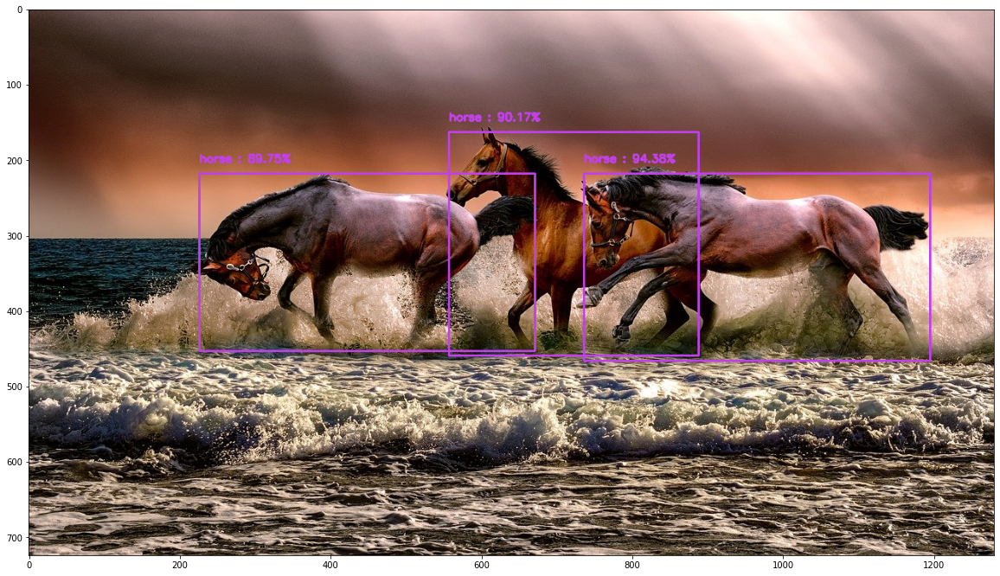

[DETECTION] car : 85.81%


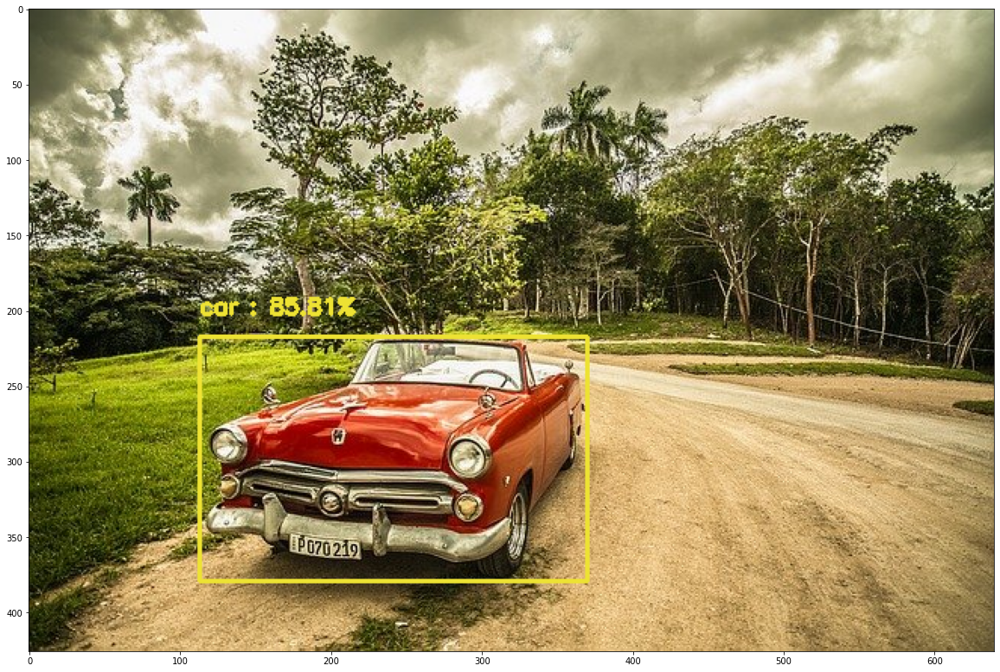

[DETECTION] car : 92.93%
[DETECTION] car : 83.19%
[DETECTION] car : 74.07%
[DETECTION] person : 58.95%
[DETECTION] person : 56.17%
[DETECTION] person : 55.66%
[DETECTION] car : 52.23%
[DETECTION] person : 51.25%


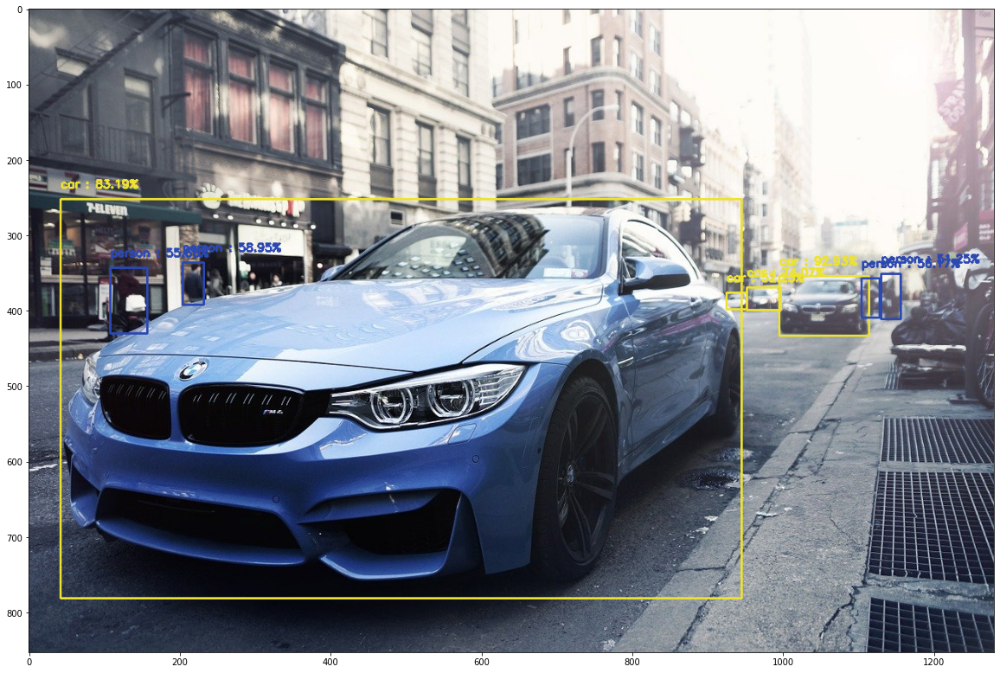

[DETECTION] elephant : 97.05%
[DETECTION] elephant : 64.52%


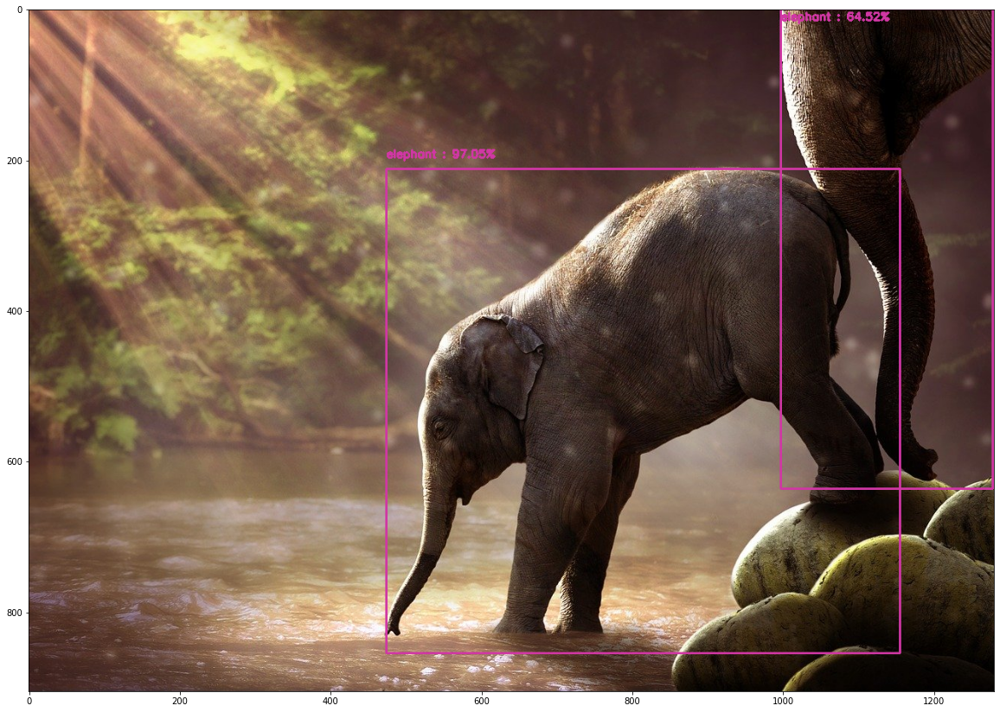

[DETECTION] cup : 88.72%
[DETECTION] person : 80.98%
[DETECTION] person : 77.94%
[DETECTION] dog : 70.19%
[DETECTION] person : 55.76%


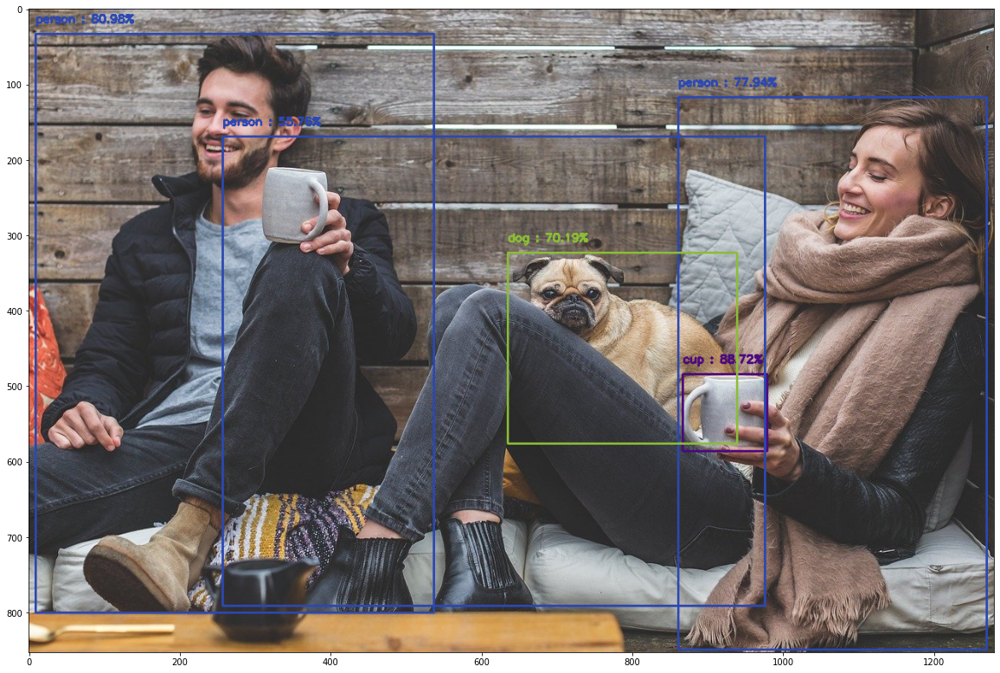

In [7]:
for root, dirs, files in os.walk(DATA_FOLDER):
    for file in files:
        image = cv2.imread(os.path.join(DATA_FOLDER, file))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        #The input to the model is expected to be of shape [C, H, W], and should be in 0-1 range.
        image_for_pred = image.transpose((2, 0, 1)) / 255.0
        image_for_pred = np.expand_dims(image_for_pred, axis=0)
        image_for_pred = torch.FloatTensor(image_for_pred)
                
        with torch.no_grad():
            detections = detection_model(image_for_pred)[0]
        
        #Show only detections where score is above 0.5
        detections['boxes'] = detections['boxes'][detections['scores'] > CONF_THRESH]
        detections['labels'] = detections['labels'][detections['scores'] > CONF_THRESH]
        detections['scores'] = detections['scores'][detections['scores'] > CONF_THRESH]
        
        #perform non-maximum supression to avoid too many overlapping bboxes
        nms_idx = ops.batched_nms(boxes=detections['boxes'], scores=detections['scores'], \
                                         idxs=detections['labels'], iou_threshold=0.3)
        
        detections['boxes'] = detections['boxes'][nms_idx]
        detections['labels'] = detections['labels'][nms_idx]
        detections['scores'] = detections['scores'][nms_idx]

        for box, label, score in zip(detections['boxes'], detections['labels'], detections['scores']):
            box = box.detach().cpu().numpy()
            label = label.item()
            score = score.item()
            
            #draw bbox and its prediction
            (x1, y1, x2, y2) = box.astype('int')
            log = f'{COCO_CLASS_NAMES[label]} : {score * 100:.2f}%'
            print(f'[DETECTION] {log}')
            cv2.rectangle(image, (x1, y1), (x2, y2), COLORS[label], 2)
            y = y1 - 15 if y1 - 15 > 15 else y1 + 15
            cv2.putText(image, log, (x1, y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, COLORS[label], 2)

        display_image(image)
        cv2.imwrite(os.path.join(RESULT_FOLDER, f'detected_{file}'), cv2.cvtColor(image, cv2.COLOR_RGB2BGR))